In [222]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import librosa
import librosa.display   #for loading and visualizing audio files
import IPython.display as ipd   #to play audio

plt.style.use('ggplot')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline
import time 
import pickle

# Modelling

Have obtained full dataframe covering audio files within folders 0 - 100 for classifying genres using method 1. 
Will try following models :

- Logistic Regression
- Decision Tree
- Random Forest (Single high n_estimators in GS)
- Adaboost (Single high n_estimators in GS)
- Naive Bayes
- SVM
- KNN
- Bagging (Bag 2nd best model)

Without labels :
- Cluster

In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import librosa
import librosa.display   #for loading and visualizing audio files
import IPython.display as ipd   #to play audio
from IPython.display import Audio

sound_file = '/Users/KarimChammaa/Desktop/DJ/NEW/Cypress Hill - When the Ship Goes Down.mp3'

plt.style.use('ggplot')
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
import time 
import pickle

In [2]:
from sklearn import datasets, metrics, svm, linear_model, naive_bayes
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedKFold
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, average_precision_score, plot_confusion_matrix, plot_roc_curve, plot_precision_recall_curve, auc

In [3]:
df_classifier1_0_100 = pd.read_csv('/Volumes/Extreme SSD/CAPSTONE_DATA/saved/final_dfs/df_classifier1_0_100_trim.csv',dtype = {'track_id':str, 'folder':str}, index_col=False) #loading csv
#df_classifier1_0_100.drop(axis = 1, columns=['Unnamed: 0','level_0','index'],inplace =True)
df_classifier1_0_100.drop(axis = 1, columns=['Unnamed: 0','index'],inplace =True)

### New Baseline 

In [544]:
len(df_classifier1_0_100.columns[5:])

3388

In [5]:
round(df_classifier1_0_100.genres_top.value_counts(normalize = True, ascending=False)[0],3)

0.303

### Test Train Split | Standardize

In [6]:
X = df_classifier1_0_100[df_classifier1_0_100.columns[5:]]
y = df_classifier1_0_100.genres_top

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, test_size=0.3, random_state=1, shuffle = True)

scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

#### Logistic Regression

In [114]:
model_logreg = LogisticRegression(max_iter=10000,random_state= 1, penalty='none')
model_logreg.fit(X_train, y_train)

LogisticRegression(max_iter=10000, penalty='none', random_state=1)

In [115]:
cv_score = cross_val_score(model_logreg, X_train, y_train, cv = 5)

In [116]:
print("mean CV Score:",round(cv_score.mean(),3))
print("Train score:", round(model_logreg.score(X_train, y_train),3))
print("Test score:", round(model_logreg.score(X_test, y_test),3))

mean CV Score: 0.528
Train score: 1.0
Test score: 0.533


In [118]:
model_logreg = LogisticRegression(max_iter=100000, random_state= 1, verbose = 2)
model_logreg.fit(X_train, y_train)
cv_score = cross_val_score(model_logreg, X_train, y_train, cv = 5)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  1.9min remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  1.9min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   56.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   56.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  1.4min remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  1.4min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  1.8min remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  1.8min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

In [119]:
print("mean CV Score:",round(cv_score.mean(),3))
print("Train score:", round(model_logreg.score(X_train, y_train),3))
print("Test score:", round(model_logreg.score(X_test, y_test),3))

mean CV Score: 0.551
Train score: 1.0
Test score: 0.54


- 'penalty' : elasticnet
- 'solver' : saga

In [ ]:
model_LgR = LogisticRegression(max_iter=100000, random_state= 1)
params = {'C': np.logspace(-5, 2, 5),
          'l1_ratio' : np.linspace(0.0001,1,5),
          'penalty': ['elasticnet'],
          'solver': ['saga']}

gs = GridSearchCV(estimator= model_LgR, param_grid= params,  cv= 5,scoring='accuracy',n_jobs = -1, verbose=3)
gs.fit(X_train, y_train)

In [ ]:
best_LgR = gs.best_estimator_
print("Best estimator :", gs.best_estimator_.get_params())
print("Train score:", round(best_LgR.score(X_train, y_train),4))
print("Test score:", round(best_LgR.score(X_test, y_test),4))
print("Best CV score :", gs.best_score_)

In [ ]:
Audio(sound_file, autoplay=True)

- GS Final

In [7]:
model_LgR = LogisticRegression(max_iter=100000, random_state= 1)
params = {'C': [0.0001],
          'l1_ratio' : [1],
          'penalty': ['elasticnet'],
          'solver': ['saga']}

gs = GridSearchCV(estimator= model_LgR, param_grid= params,  cv= 5,scoring='accuracy',n_jobs = -1, verbose=3)
gs.fit(X_train, y_train)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   14.0s remaining:   21.1s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   14.4s finished


GridSearchCV(cv=5,
             estimator=LogisticRegression(max_iter=100000, random_state=1),
             n_jobs=-1,
             param_grid={'C': [0.0001], 'l1_ratio': [1],
                         'penalty': ['elasticnet'], 'solver': ['saga']},
             scoring='accuracy', verbose=3)

In [8]:
best_LgR = gs.best_estimator_
print("Best estimator :", gs.best_estimator_.get_params())
print("Train score:", round(best_LgR.score(X_train, y_train),4))
print("Test score:", round(best_LgR.score(X_test, y_test),4))
print("Best CV score :", gs.best_score_)

Best estimator : {'C': 0.0001, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': 1, 'max_iter': 100000, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'elasticnet', 'random_state': 1, 'solver': 'saga', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}
Train score: 0.3033
Test score: 0.3033
Best CV score : 0.3032762916109208


#### Decision Tree

In [120]:
model_decTree = DecisionTreeClassifier(criterion='gini', max_features=1.0, max_depth= 30, random_state=1)
model_decTree.fit(X_train, y_train)
cv_score = cross_val_score(model_decTree, X_train, y_train)

In [121]:
print("Mean CV Score:",round(cv_score.mean(),4))
print("Train score:", round(model_decTree.score(X_train, y_train),3))
print("Test score:", round(model_decTree.score(X_test, y_test),3))

Mean CV Score: 0.4639
Train score: 0.997
Test score: 0.463


#### Random Forest

In [1]:
model_RF = RandomForestClassifier(n_estimators=200 ,criterion='gini', max_features='auto', max_depth= 30, random_state=1, verbose =2)
model_RF.fit(X_train, y_train)
cv_score = cross_val_score(model_RF, X_train, y_train, cv = 5) 

In [171]:
print("CV scores:", cv_score)
print("Mean CV Score:",round(cv_score.mean(),4))
print("Train score:", round(model_RF.score(X_train, y_train),3))
print("Test score:", round(model_RF.score(X_test, y_test),3))

CV scores: [0.62288749 0.63785611 0.62819894 0.64654756 0.61226461]
Mean CV Score: 0.6296


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Train score: 0.999
Test score: 0.629


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.4s finished


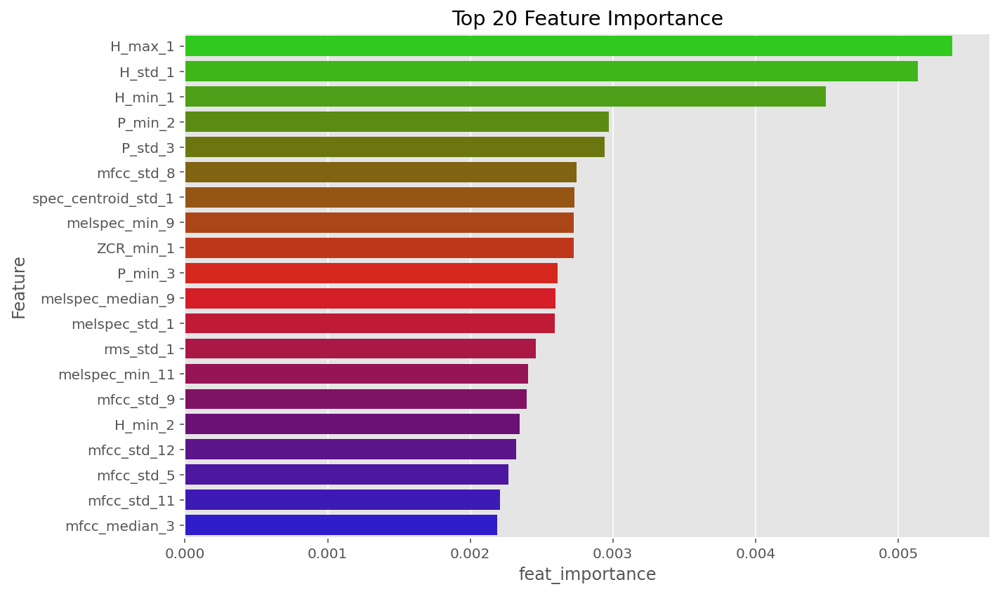

In [173]:
feat_imp = pd.DataFrame(list(zip(X.columns, model_RF.feature_importances_)), columns=['feature','feat_importance']).sort_values(by='feat_importance', ascending=False)
feat_imp_top20 = feat_imp.head(20)

fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(10,6))

sns.barplot(x = feat_imp_top20.feat_importance, y = feat_imp_top20.feature, orient='h', ax=ax, palette = 'brg_r')
ax.set_title('Top 20 Feature Importance')
ax.set_ylabel('Feature')
fig.tight_layout()
plt.show()

- max_features : 0.3, 0.5, 0.8, 1.0
- max_depth : 10, 30, 60 , None
- n_estimators : 200 

In [2]:
model_RF = RandomForestClassifier(criterion='gini', max_features='auto', max_depth= 30, random_state=1, verbose =2)

params = {'n_estimators': [200],
          'max_features' : [0.3, 0.5, 0.8, 1],
          'max_depth': [10, 30, 60, None]}

gs = GridSearchCV(estimator= model_RF, param_grid= params,  cv= 5,scoring='accuracy',n_jobs = -1, verbose=3)
gs.fit(X_train, y_train)

In [6]:
best_RF = gs.best_estimator_

print("Best estimator :", gs.best_estimator_.get_params())
print("Train score:", round(best_RF.score(X_train, y_train),4))
print("Test score:", round(best_RF.score(X_test, y_test),4))
print("Best CV score :", gs.best_score_)

Best estimator : {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 0.3, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 200, 'n_jobs': None, 'oob_score': False, 'random_state': 1, 'verbose': 2, 'warm_start': False}


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.9s finished


Train score: 1.0


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Test score: 0.6453
Best CV score : 0.6383499695294933


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.3s finished


- max_features : 0.05, 0.1, 0.2, 0.3
- max_depth : 10, 30, 60 , None
- n_estimators : 200 

In [3]:
model_RF = RandomForestClassifier(criterion='gini', random_state=1, verbose =2)

params = {'n_estimators': [200],
          'max_features' : [0.05, 0.1, 0.2, 0.3],
          'max_depth': [60, 100, None],
         'ccp_alpha': [0.0,0.4,0.8]}

gs = GridSearchCV(estimator= model_RF, param_grid= params,  cv= 5,scoring='accuracy',n_jobs = -2, verbose=3)
gs.fit(X_train, y_train)

In [8]:
best_RF = gs.best_estimator_

print("Best estimator :", gs.best_estimator_.get_params())
print("Train score:", round(best_RF.score(X_train, y_train),4))
print("Test score:", round(best_RF.score(X_test, y_test),4))
print("Best CV score :", gs.best_score_)

Best estimator : {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': 60, 'max_features': 0.1, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 200, 'n_jobs': None, 'oob_score': False, 'random_state': 1, 'verbose': 2, 'warm_start': False}


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Train score: 1.0
Test score: 0.6397
Best CV score : 0.6390268584090426


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.3s finished


For presentation

- max_features : 0.05, 0.1
- max_depth : 40,50 60 , None
- n_estimators : 200 

#### AdaBoost

- B.E : Decision Tree
- n_estimators : 100

In [192]:
base_estimator = DecisionTreeClassifier(max_depth=5, max_features=0.3)
model_AB = AdaBoostClassifier(base_estimator = base_estimator, n_estimators = 100, random_state=1)
model_AB.fit(X_train, y_train)
cv_score = cross_val_score(model_AB, X_train, y_train, cv = 5) 

In [193]:
print("Mean CV Score:",round(cv_score.mean(),4))
print("Train score:", round(model_AB.score(X_train, y_train),3))
print("Test score:", round(model_AB.score(X_test, y_test),3))

Mean CV Score: 0.4165
Train score: 0.997
Test score: 0.463


- B.E : Logistic Regression
- n_estimators : 200

In [4]:
base_estimator = LogisticRegression(max_iter=10000,random_state= 1, penalty='l2', verbose = 2)
model_AB = AdaBoostClassifier(base_estimator = base_estimator, n_estimators = 200, random_state=1)
model_AB.fit(X_train, y_train)
cv_score = cross_val_score(model_AB, X_train, y_train, cv = 5) 

In [196]:
print("Mean CV Score:",round(cv_score.mean(),4))
print("Train score:", round(model_AB.score(X_train, y_train),3))
print("Test score:", round(model_AB.score(X_test, y_test),3))

Mean CV Score: 0.5063
Train score: 0.583
Test score: 0.489


#### Naive Bayes
- Can only use GaussianNB as I have continuous data and multiclass
- Power transform to obtain more normally distributed features

In [197]:
from sklearn.preprocessing import PowerTransformer

In [199]:
power = PowerTransformer()
X_trainp = power.fit_transform(X_train)
X_testp = power.transform(X_test)

/Applications/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:2995: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


In [200]:
power.inverse_transform(X_trainp)

/Applications/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:2937: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1


array([[ 2.72455104e-02, -2.53650917e-03,  7.72876894e-02, ...,
        -1.62221607e-01, -1.30357142e-02, -2.44737019e-01],
       [ 2.33506117e-02,  1.11701846e-02,  2.85576444e-01, ...,
        -1.69388411e-02, -8.82013280e-03,  2.97238033e-02],
       [ 2.32811470e-02,  8.75821852e-02, -7.35516633e-01, ...,
         3.33435137e-02, -1.31150841e-02,  2.18667063e-01],
       ...,
       [ 2.14277394e-02,  1.90712454e-02,  1.34820368e+00, ...,
         5.91156278e-02, -9.42677748e-03, -1.10101900e-01],
       [ 2.35000717e-02,  7.88198441e-02,  1.06216068e+00, ...,
        -1.62709894e-02,  1.24230799e-04,  2.07331392e-01],
       [ 2.30612467e-02, -1.12617757e-01, -2.82871262e-01, ...,
        -3.42404220e-02, -4.54304744e-03, -2.29047353e-01]])

In [206]:
model_NB = naive_bayes.GaussianNB()
model_NB.fit(X_trainp, y_train)
cv_score = cross_val_score(model_NB, X_trainp, y_train, cv = 5)

In [207]:
print("Mean CV Score:",round(cv_score.mean(),4))
print("Train score:", round(model_NB.score(X_trainp, y_train),3))
print("Test score:", round(model_NB.score(X_testp, y_test),3))

Mean CV Score: 0.2366
Train score: 0.341
Test score: 0.229


#### SVM

In [5]:
model_SVM = svm.SVC(kernel='poly')

param_grid = {'C' : np.logspace(-5, 2, 4),
             'gamma': np.linspace(0.01, 2, 4)}

gs = GridSearchCV(model_SVM, param_grid, cv=5, scoring='accuracy', verbose=2, n_jobs=-2)
gs.fit(X_train, y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=-2)]: Using backend LokyBackend with 15 concurrent workers.
[Parallel(n_jobs=-2)]: Done  11 tasks      | elapsed: 44.3min
[Parallel(n_jobs=-2)]: Done  80 out of  80 | elapsed: 230.1min finished


GridSearchCV(cv=5, estimator=SVC(kernel='poly'), n_jobs=-2,
             param_grid={'C': array([1.00000000e-05, 2.15443469e-03, 4.64158883e-01, 1.00000000e+02]),
                         'gamma': array([0.01      , 0.67333333, 1.33666667, 2.        ])},
             scoring='accuracy', verbose=2)

In [6]:
best_SVM = gs.best_estimator_
print("Best estimator :", gs.best_estimator_.get_params())
print("Train score:", round(best_SVM.score(X_train, y_train),4))
print("Test score:", round(best_SVM.score(X_test, y_test),4))
print("Best CV score :", gs.best_score_)

Best estimator : {'C': 1e-05, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 0.6733333333333333, 'kernel': 'poly', 'max_iter': -1, 'probability': False, 'random_state': None, 'shrinking': True, 'tol': 0.001, 'verbose': False}
Train score: 1.0
Test score: 0.6151
Best CV score : 0.6087751323307253


#### KNN
- Minkowski metric : Manhattan, Euclidean (P = 1, 2)
- n : 1 - 5
- weights : uniform, distance

In [5]:
model_KNN = KNeighborsClassifier()

param_grid = {'n_neighbors' : [1,2,3,4,5], 'p': [1,2], 'weights': ['uniform','distance']}

gs = GridSearchCV(model_KNN, param_grid, cv=5, scoring='accuracy', verbose=2)
gs.fit(X_train, y_train)

In [12]:
best_KNN = gs.best_estimator_

print("Best estimator :", gs.best_estimator_.get_params())
print("Train score:", round(best_KNN.score(X_train, y_train),4))
print("Test score:", round(best_KNN.score(X_test, y_test),4))
print("Best CV score :", gs.best_score_)

Best estimator : {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 1, 'weights': 'distance'}
Train score: 1.0
Test score: 0.5917
Best CV score : 0.5824883079645935


- Minkowski metric : Manhattan (P = 1)
- 'weights' : distance
- n : 5 , 7 , 10 , 20

In [6]:
model_KNN = KNeighborsClassifier()

param_grid = {'n_neighbors' : [5,7,10,20,30], 'p': [1], 'weights': ['distance']}

gs = GridSearchCV(model_KNN, param_grid, cv=5, scoring='accuracy', verbose=2)
gs.fit(X_train, y_train)

In [6]:
best_KNN = gs.best_estimator_

print("Best estimator :", gs.best_estimator_.get_params())
print("Train score:", round(best_KNN.score(X_train, y_train),4))
print("Test score:", round(best_KNN.score(X_test, y_test),4))
print("Best CV score :", gs.best_score_)

Best estimator : {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 10, 'p': 1, 'weights': 'distance'}
Train score: 1.0
Test score: 0.602
Best CV score : 0.5920564673358504


In [202]:
Audio(sound_file, autoplay=True)

## Top 3 Models Evaluation

In [598]:
from sklearn.metrics import roc_auc_score, average_precision_score, plot_roc_curve, plot_precision_recall_curve, classification_report, auc
import scikitplot as skplt

### 1. Random Forest GS

In [7]:
best_model_RF = RandomForestClassifier(criterion='gini',ccp_alpha=0.0, max_depth = 60, 
                                  max_features= 0.1, n_estimators=200, random_state=1, verbose =2 ,n_jobs=-2)
best_model_RF.fit(X_train, y_train)
cv_score = cross_val_score(best_model_RF, X_train, y_train)

In [549]:
print("Train score:", round(best_model_RF.score(X_train, y_train),4))
print("Test score:", round(best_model_RF.score(X_test, y_test),4))
print("Mean CV Score:",round(cv_score.mean(),4))

[Parallel(n_jobs=15)]: Using backend ThreadingBackend with 15 concurrent workers.
[Parallel(n_jobs=15)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=15)]: Done 132 tasks      | elapsed:    0.2s
[Parallel(n_jobs=15)]: Done 200 out of 200 | elapsed:    0.2s finished
[Parallel(n_jobs=15)]: Using backend ThreadingBackend with 15 concurrent workers.
[Parallel(n_jobs=15)]: Done  11 tasks      | elapsed:    0.0s


Train score: 1.0
Test score: 0.6397
Mean CV Score: 0.639


[Parallel(n_jobs=15)]: Done 132 tasks      | elapsed:    0.1s
[Parallel(n_jobs=15)]: Done 200 out of 200 | elapsed:    0.1s finished


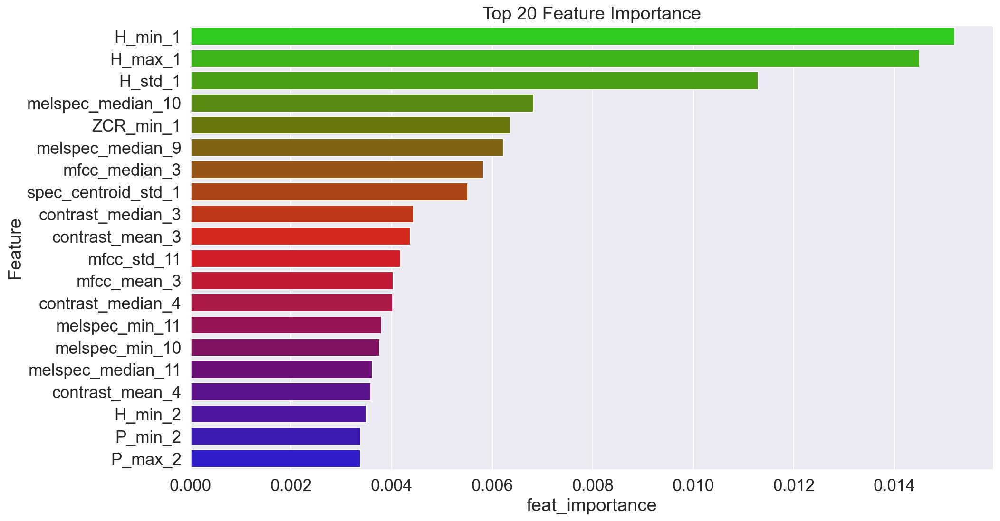

In [559]:
feat_imp = pd.DataFrame(list(zip(X.columns, best_model_RF.feature_importances_)), columns=['feature','feat_importance']).sort_values(by='feat_importance', ascending=False)
feat_imp_top20 = feat_imp.head(20)

fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(15,8))

sns.barplot(x = feat_imp_top20.feat_importance, y = feat_imp_top20.feature, orient='h', ax=ax, palette = 'brg_r')
sns.set(font_scale = 1.6)
ax.set_title('Top 20 Feature Importance')
ax.set_ylabel('Feature')

fig.tight_layout()
plt.show()

In [593]:
import seaborn as sns

[Parallel(n_jobs=15)]: Using backend ThreadingBackend with 15 concurrent workers.
[Parallel(n_jobs=15)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=15)]: Done 132 tasks      | elapsed:    0.2s
[Parallel(n_jobs=15)]: Done 200 out of 200 | elapsed:    0.2s finished
[Parallel(n_jobs=15)]: Using backend ThreadingBackend with 15 concurrent workers.
[Parallel(n_jobs=15)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=15)]: Done 132 tasks      | elapsed:    0.1s
[Parallel(n_jobs=15)]: Done 200 out of 200 | elapsed:    0.1s finished


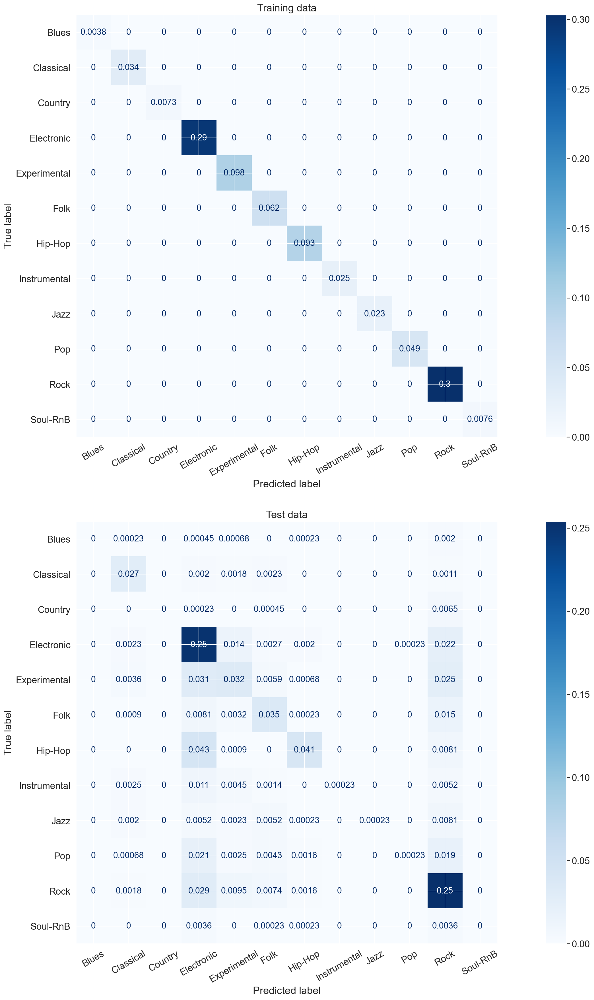

In [596]:
fig, ax = plt.subplots(nrows = 2, ncols=1, figsize=(30, 30), sharey=True)
plot_confusion_matrix(best_model_RF, X_train, y_train, cmap='Blues', ax=ax[0], normalize='all')
plot_confusion_matrix(best_model_RF, X_test, y_test, cmap='Blues', ax=ax[1], normalize='all')
ax[0].set_xticklabels(labels = sorted(y.unique()), rotation = 30)
ax[1].set_xticklabels(labels = sorted(y.unique()), rotation = 30)  
sns.set(font_scale=1.5)
#plt.rcParams.update({'font.size': 20})
ax[0].set_title('Training data')
ax[1].set_title('Test data')

for a in ax:
    texts = a.texts
    for text in texts:
        text.set_size(15)

plt.show()

In [602]:
y_test

5652       Electronic
10995    Experimental
13267            Rock
8966             Rock
6700             Rock
             ...     
3339       Electronic
12360            Rock
5611             Folk
14102            Folk
11352      Electronic
Name: genres_top, Length: 4435, dtype: object

In [599]:
from sklearn.metrics import roc_auc_score, average_precision_score, plot_roc_curve, plot_precision_recall_curve, classification_report, auc
import scikitplot as skplt

fpr, tpr, thresholds = metrics.roc_curve(y_test, best_model_RF.predict_proba(X_test)[:, 0], pos_label='high')
AUC = metrics.auc(fpr, tpr)

print("AUC:", round(AUC,5))

[Parallel(n_jobs=15)]: Using backend ThreadingBackend with 15 concurrent workers.
[Parallel(n_jobs=15)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=15)]: Done 132 tasks      | elapsed:    0.1s
[Parallel(n_jobs=15)]: Done 200 out of 200 | elapsed:    0.1s finished


AUC: nan


/Applications/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_ranking.py:813: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


[Parallel(n_jobs=15)]: Using backend ThreadingBackend with 15 concurrent workers.
[Parallel(n_jobs=15)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=15)]: Done 132 tasks      | elapsed:    0.1s
[Parallel(n_jobs=15)]: Done 200 out of 200 | elapsed:    0.1s finished


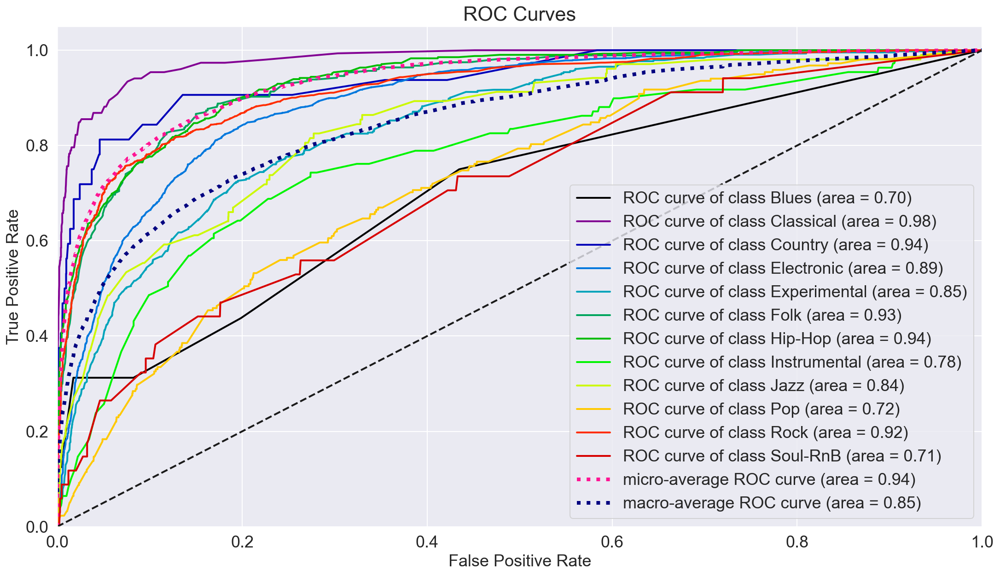

In [607]:
fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(18,10))
skplt.metrics.plot_roc(y_test, best_model_RF.predict_proba(X_test), ax=ax)
plt.show()

In [623]:
def export_legend(legend, filename="legend.png"):
    fig  = legend.figure
    fig.canvas.draw()
    bbox  = legend.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    fig.savefig(filename, dpi="figure", bbox_inches=bbox)

export_legend(legend)

In [ ]:
across all thresholds

In [627]:
y_pred = best_model_RF.predict(X_test)
print(classification_report(y_test, y_pred))

[Parallel(n_jobs=15)]: Using backend ThreadingBackend with 15 concurrent workers.
[Parallel(n_jobs=15)]: Done  11 tasks      | elapsed:    3.1s
[Parallel(n_jobs=15)]: Done 132 tasks      | elapsed:    3.2s
[Parallel(n_jobs=15)]: Done 200 out of 200 | elapsed:    3.2s finished
/Applications/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

       Blues       0.00      0.00      0.00        16
   Classical       0.66      0.79      0.72       152
     Country       0.00      0.00      0.00        32
  Electronic       0.62      0.85      0.72      1303
Experimental       0.45      0.33      0.38       434
        Folk       0.54      0.56      0.55       277
     Hip-Hop       0.86      0.44      0.58       412
Instrumental       1.00      0.01      0.02       109
        Jazz       1.00      0.01      0.02       103
         Pop       0.50      0.00      0.01       218
        Rock       0.69      0.84      0.75      1345
    Soul-RnB       0.00      0.00      0.00        34

    accuracy                           0.64      4435
   macro avg       0.53      0.32      0.31      4435
weighted avg       0.64      0.64      0.59      4435



[Parallel(n_jobs=15)]: Using backend ThreadingBackend with 15 concurrent workers.
[Parallel(n_jobs=15)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=15)]: Done 132 tasks      | elapsed:    0.1s
[Parallel(n_jobs=15)]: Done 200 out of 200 | elapsed:    0.1s finished


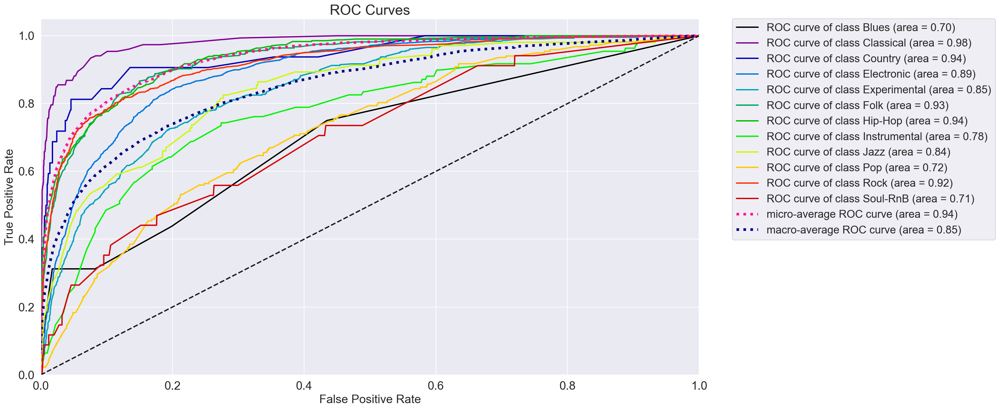

In [625]:
fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(18,10))
skplt.metrics.plot_roc(y_test, best_model_RF.predict_proba(X_test), ax=ax)
plt.legend(loc='upper right')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

[Parallel(n_jobs=15)]: Using backend ThreadingBackend with 15 concurrent workers.
[Parallel(n_jobs=15)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=15)]: Done 132 tasks      | elapsed:    0.1s
[Parallel(n_jobs=15)]: Done 200 out of 200 | elapsed:    0.1s finished


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

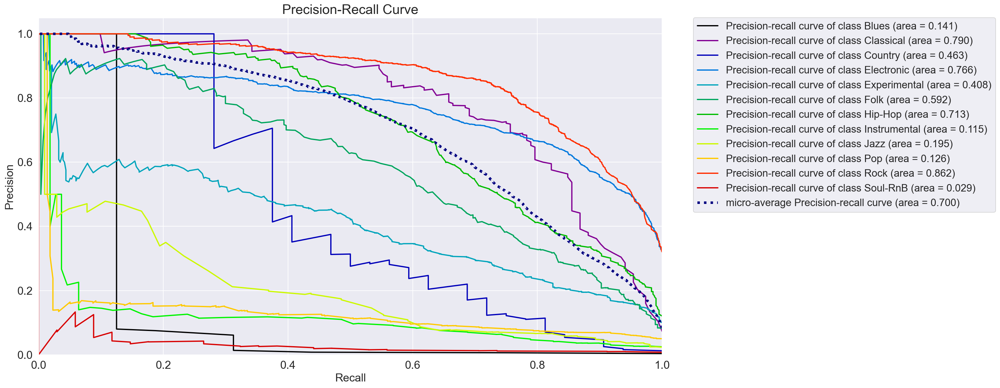

In [624]:
import pylab
fig = pylab.figure()
figlegend = pylab.figure()

fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(18,10))
skplt.metrics.plot_precision_recall(y_test, best_model_RF.predict_proba(X_test),ax=ax)
plt.legend(loc='upper right')
#figlegend = pylab.figure()
#legend = ax.get_legend()
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()